# Crop Field NNCLR with Graph-based segmentation

This notebook is part of the field boundary detection project. The goal is to evaluate the algorithm using single samples (1D) instead of 2D combining time series of the same h3 hex AND semi-supervised contrastive learning with Graph-based segmentation.

## Summary
[1. Data Processing](#data_processing)

[2. Model Training](#model_training)

[3. Graph Based Segmenation](#graphbased_segmentation)

## Load required libraries

In [1]:
import sys

# Install packages required only once
install_packages = False

if install_packages:
    !{sys.executable} -m pip install sklearn
    !{sys.executable} -m pip install seaborn

In [2]:
import math
import matplotlib.pyplot as plt
from matplotlib import pyplot

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import seaborn.objects as so
import seaborn as sns

import pandas as pd
import numpy as np

import folium
import h3

## Hyper-parameters and other constants

In [3]:
temporal_samples = 15
band_features = ['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B11', 'B12']

width = 60 # output vector size
temperature = 0.1 # empirical temperature value

steps_per_epoch = 20
AUTOTUNE = tf.data.AUTOTUNE
shuffle_buffer = 5
num_epochs = 40
kernel_size = 3
strides = 1
queue_size = 10000

# Stronger augmentations for contrastive, weaker ones for supervised training
contrastive_augmentation = {"jitter": 0.15}
classification_augmentation = {"jitter": 0.05}

<a id='data_processing'></a>

# 1. Data Processing

<div>
<img border="5px" src="../res/dataprocessing.png" width="1000"/>
</div>

## Configure the train and test datasets

In [4]:
from pathlib import Path

positive_samples_folder = Path('D:\\173_seeding_harvest_joined_USCA.parquet\\positive_samples\\hex_index_L3=8348b3fffffffff')
negative_samples_folder = Path('D:\\173_seeding_harvest_joined_USCA.parquet\\negative_samples\\hex_index_L3=8348b3fffffffff')

## Load all parquet files from the configured folder

In [5]:
df_positive = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in positive_samples_folder.rglob('*.parquet')
         )

df_negative = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in negative_samples_folder.rglob('*.parquet'))

print('The shape of loaded positive dataframe is:', df_positive.shape)
print('The shape of loaded negative dataframe is:', df_negative.shape)

df_positive = df_positive.drop_duplicates()
df_negative = df_negative.drop_duplicates()

df_positive['timestamp'] = df_positive.scene_id.str[11:26]
df_negative['timestamp'] = df_negative.scene_id.str[11:26]

print('The shape of loaded positive dataframe is:', df_positive.shape)
print('The shape of loaded negative dataframe is:', df_negative.shape)

display(df_positive.head(5))
display(df_negative.head(5))

The shape of loaded positive dataframe is: (98148, 19)
The shape of loaded negative dataframe is: (74163, 19)
The shape of loaded positive dataframe is: (98148, 20)
The shape of loaded negative dataframe is: (74163, 20)


,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,timestamp
0,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c13ff,4,14RPQ,521.0,536.0,1036.0,634.0,1486.0,3316.0,3837.0,3984.0,4040.0,3963.0,2649.0,1518.0,20181029T170421
1,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c17ff,4,14RPQ,521.0,537.0,1036.0,638.0,1504.0,3390.0,3843.0,3842.0,4074.0,3963.0,2607.0,1495.0,20181029T170421
2,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c23ff,4,14RPQ,527.0,565.0,849.0,753.0,1390.0,2555.0,2796.0,2536.0,3128.0,3746.0,2583.0,1605.0,20181029T170421
3,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c27ff,4,14RPQ,556.0,509.0,979.0,736.0,1462.0,2922.0,3187.0,3292.0,3500.0,3856.0,2598.0,1540.0,20181029T170421
4,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c31ff,4,14RPQ,527.0,536.0,1011.0,660.0,1512.0,3284.0,3733.0,3654.0,3985.0,3746.0,2603.0,1538.0,20181029T170421


,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,timestamp
0,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c01ff,5,14RPQ,888.0,1034.0,1458.0,1546.0,1956.0,3277.0,3696.0,4004.0,3844.0,3662.0,3317.0,2241.0,20181029T170421
1,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c03ff,4,14RPQ,888.0,934.0,1272.0,1340.0,1669.0,2765.0,3081.0,2800.0,3364.0,3662.0,2883.0,1914.0,20181029T170421
2,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c05ff,4,14RPQ,888.0,1042.0,1458.0,1552.0,1903.0,3050.0,3344.0,3124.0,3636.0,3662.0,3379.0,2425.0,20181029T170421
3,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c07ff,4,14RPQ,888.0,956.0,1256.0,1370.0,1643.0,2492.0,2738.0,2832.0,3076.0,3662.0,2916.0,2007.0,20181029T170421
4,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c0bff,4,14RPQ,760.0,916.0,1368.0,1090.0,1844.0,3406.0,3768.0,4232.0,4069.0,3958.0,3155.0,1978.0,20181029T170421


## Remove hexes that are represented in both positive and negative datasets

In [6]:
df_positive = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in positive_samples_folder.rglob('*.parquet')
         )

df_negative = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in negative_samples_folder.rglob('*.parquet'))

print('The shape of loaded positive dataframe is:', df_positive.shape)
print('The shape of loaded negative dataframe is:', df_negative.shape)

df_positive = df_positive.drop_duplicates()
df_negative = df_negative.drop_duplicates()

df_positive['timestamp'] = df_positive.scene_id.str[11:26]
df_negative['timestamp'] = df_negative.scene_id.str[11:26]

print('The shape of loaded positive dataframe is:', df_positive.shape)
print('The shape of loaded negative dataframe is:', df_negative.shape)

display(df_positive.head(5))
display(df_negative.head(5))

The shape of loaded positive dataframe is: (98148, 19)
The shape of loaded negative dataframe is: (74163, 19)
The shape of loaded positive dataframe is: (98148, 20)
The shape of loaded negative dataframe is: (74163, 20)


,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,timestamp
0,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c13ff,4,14RPQ,521.0,536.0,1036.0,634.0,1486.0,3316.0,3837.0,3984.0,4040.0,3963.0,2649.0,1518.0,20181029T170421
1,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c17ff,4,14RPQ,521.0,537.0,1036.0,638.0,1504.0,3390.0,3843.0,3842.0,4074.0,3963.0,2607.0,1495.0,20181029T170421
2,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c23ff,4,14RPQ,527.0,565.0,849.0,753.0,1390.0,2555.0,2796.0,2536.0,3128.0,3746.0,2583.0,1605.0,20181029T170421
3,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c27ff,4,14RPQ,556.0,509.0,979.0,736.0,1462.0,2922.0,3187.0,3292.0,3500.0,3856.0,2598.0,1540.0,20181029T170421
4,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c31ff,4,14RPQ,527.0,536.0,1011.0,660.0,1512.0,3284.0,3733.0,3654.0,3985.0,3746.0,2603.0,1538.0,20181029T170421


,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,timestamp
0,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c01ff,5,14RPQ,888.0,1034.0,1458.0,1546.0,1956.0,3277.0,3696.0,4004.0,3844.0,3662.0,3317.0,2241.0,20181029T170421
1,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c03ff,4,14RPQ,888.0,934.0,1272.0,1340.0,1669.0,2765.0,3081.0,2800.0,3364.0,3662.0,2883.0,1914.0,20181029T170421
2,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c05ff,4,14RPQ,888.0,1042.0,1458.0,1552.0,1903.0,3050.0,3344.0,3124.0,3636.0,3662.0,3379.0,2425.0,20181029T170421
3,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c07ff,4,14RPQ,888.0,956.0,1256.0,1370.0,1643.0,2492.0,2738.0,2832.0,3076.0,3662.0,2916.0,2007.0,20181029T170421
4,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c0bff,4,14RPQ,760.0,916.0,1368.0,1090.0,1844.0,3406.0,3768.0,4232.0,4069.0,3958.0,3155.0,1978.0,20181029T170421


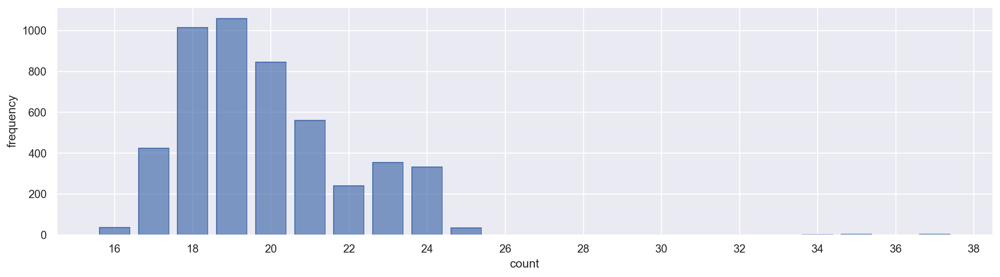

In [7]:
sns.set(rc={'figure.figsize':(18.7,18.27)})

temporal_samples_count = df_positive.groupby(['hex'])['hex'].count()

hist = pd.DataFrame(temporal_samples_count) \
        .rename(columns={'hex': 'count'}) \
        .reset_index(level=0) \
        .groupby(['count'])['count'].count()

hist_df = pd.DataFrame(hist) \
          .rename(columns={'count': 'frequency'}) \
          .reset_index(level=0)

so.Plot(hist_df["count"], hist_df["frequency"]) \
    .add(so.Bar()) \
    .scale(x=so.Continuous().tick(every=2)) \
    .layout(size=(14, 4))

## Sentinel 2 bands
These are the 12 bands contained in the parque files and their respective meanings

<div>
<img src="../res/sentinel2-bands.png" width="500"/>
</div>

## Show some of the L12 hexes loaded in the folium map

In [8]:
h3_hex = h3.h3_to_parent(df_positive.iloc[0]['hex'], 3)

center = h3.h3_to_geo_boundary(h=h3_hex,geo_json=True)

hexes_to_print=500
df_positive_single_hex = df_positive.drop_duplicates(subset='hex', keep="first").head(hexes_to_print)
df_negative_single_hex = df_negative.drop_duplicates(subset='hex', keep="first").head(hexes_to_print)

m = folium.Map(location=(center[0][1], center[0][0]),
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                zoom_start=17,
                overlay = False,
                control = True)

# Print h3 hex
geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=h3_hex,geo_json=True)]}
geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'white', 'color': 'white', 'weight': 0.5})
geo_j.add_to(m)

# Print positive samples
for index, row in df_positive_single_hex.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'yellow', 'color': 'green', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

# Print negative samples
for index, row in df_negative_single_hex.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'red', 'color': 'black', 'weight': 0.5})
    folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

m

# Visualize the samples in the space reduced to 2 dimensions

In [9]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler

number_of_bands = len(band_features)

# Keep only [temporal samples] samples 
df_positive = df_positive.sort_values(by=['hex'])
df_positive = df_positive.groupby('hex').head(temporal_samples)

df_negative = df_negative.sort_values(by=['hex'])
df_negative = df_negative.groupby('hex').head(temporal_samples)

df_negative = df_negative.assign(label=0)
df_positive = df_positive.assign(label=1)
df = pd.concat([df_positive, df_negative], axis=0)

df[band_features] = StandardScaler().fit_transform(df[band_features])

# Organize the 2D samples in numpy arrays
sample = np.zeros((temporal_samples, number_of_bands), dtype=np.float64)
X_array = np.empty((0, temporal_samples, number_of_bands),  dtype=np.float64)
X_list = []

labels = []
hexes = []
timestamp_tracking = []
timestamp_sample = []

sub_index = 0


count = 0;
for index, row in df.iterrows():
        # fill the band values in a temporal row
        for idx,b in enumerate(band_features):
            sample[sub_index][idx] = row[b]

        pct_complete = count/df.shape[0] * 100
        print('{0:.2f}'.format(pct_complete) + '%', end='\r')
        count = count + 1
        timestamp_sample.append(row.timestamp)
         
        # increment row number 
        sub_index = sub_index + 1
        
        # if reached last row of temporal samples, increment to next sample
        if sub_index == temporal_samples:
            shuffler = np.random.permutation(sample.shape[0])
            sample = sample[shuffler]
            timestamp_sample = list(np.array(timestamp_sample)[shuffler])

            #X_array = np.append(X_array, [sample], axis=0)
            X_list.append(sample)
            labels.append(row.label)
            hexes.append(row.hex)
            timestamp_tracking.append(timestamp_sample.copy())            
            timestamp_sample.clear()
            sub_index = 0

print(X_array.shape)
print(len(labels))
print(len(hexes))    

(0, 15, 12)
8710
8710


In [10]:
X_array = np.array(X_list)

print(X_array.shape)

(8710, 15, 12)


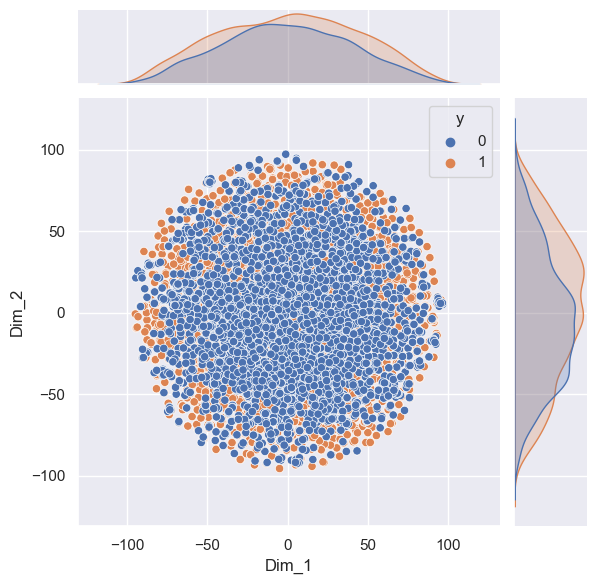

In [11]:
from sklearn.manifold import TSNE
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

model = TSNE(n_components=2, perplexity=4, random_state=0)
tsne_data = model.fit_transform(X_array.reshape(X_array.shape[0], number_of_bands * temporal_samples))
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2"))
tsne_data = pd.concat([tsne_df, pd.DataFrame(labels, columns=['y'])], axis=1)
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "y"))

sns.jointplot(data=tsne_df, x="Dim_1", y="Dim_2", hue='y')
plt.show()
warnings.filterwarnings('default')

<AxesSubplot:xlabel='variable', ylabel='value'>

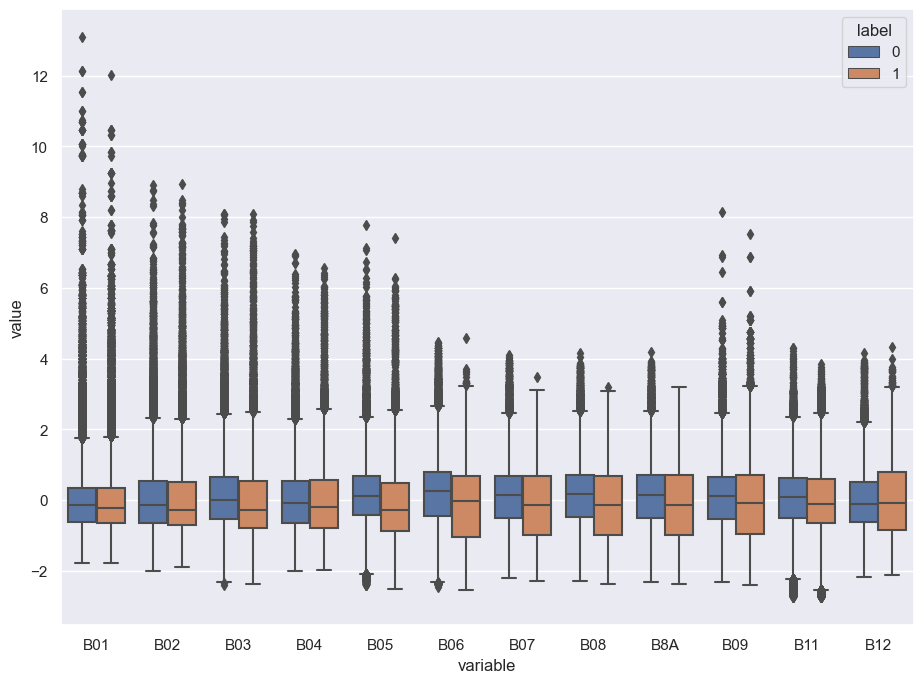

In [12]:
import pandas as pd
import seaborn as sns


value_vars = [i for i in df.columns if i.startswith('B')]
id_vars = ['label']
data = pd.melt(df, id_vars=id_vars, value_vars=value_vars)

sns.set(rc={'figure.figsize':(11,8)})
sns.boxplot(x="variable", y="value", hue='label', data=data)

# Check correlation of Sentinel 2 bands

<AxesSubplot:>

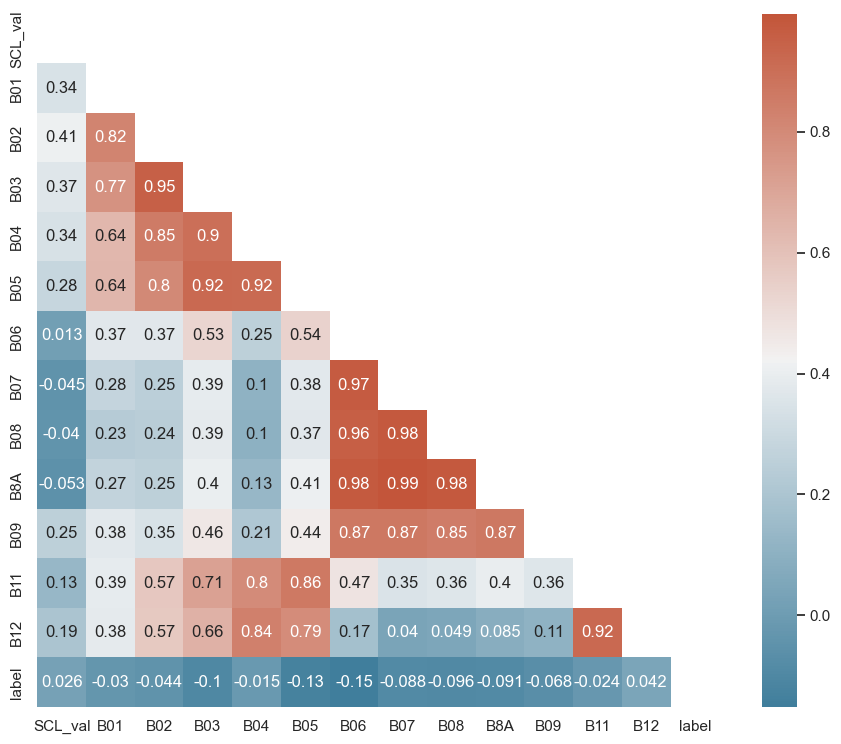

In [13]:
sns.set_theme(style="white")
# Compute the correlation matrix
corr = df.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr,mask=mask,cmap=cmap, annot=True )

Avg Positive Similarity:  0.11803310258406963
Avg Negative Similarity:  0.14782139106540965
Avg Disimilarity P-N:  -0.06157223086168894
Avg Disimilarity N-P:  -0.06157223086168894


<AxesSubplot:>

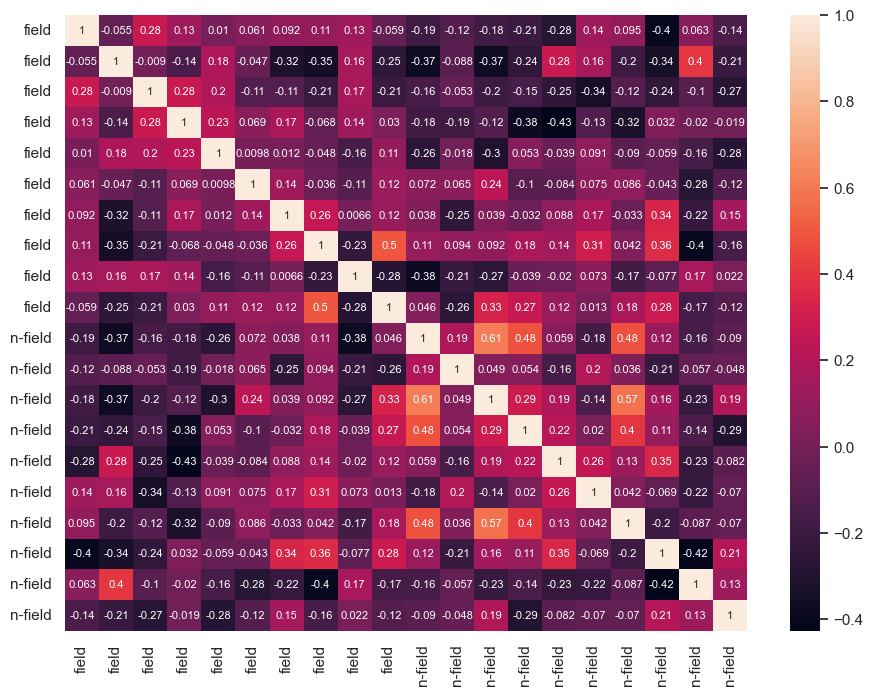

In [14]:
from sklearn import preprocessing
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics.pairwise import euclidean_distances

number_of_hexes = 10

X_array_positive = X_array[np.array(labels)==1][:number_of_hexes]
X_array_negative = X_array[np.array(labels)==0][:number_of_hexes]
X_array_samples = np.concatenate([X_array_positive, X_array_negative])
df_labels = np.concatenate((np.repeat('field',number_of_hexes), np.repeat('n-field', number_of_hexes)))

similarities = cosine_similarity(X_array_samples.reshape(number_of_hexes * 2, number_of_bands * temporal_samples), X_array_samples.reshape(number_of_hexes * 2, number_of_bands * temporal_samples))

print('Avg Positive Similarity: ', np.average(similarities[0:number_of_hexes, 0:number_of_hexes]))
print('Avg Negative Similarity: ', np.average(similarities[number_of_hexes:number_of_hexes*2, number_of_hexes:number_of_hexes*2]))
print('Avg Disimilarity P-N: ', np.average(similarities[0:number_of_hexes, number_of_hexes:number_of_hexes*2]))
print('Avg Disimilarity N-P: ', np.average(similarities[number_of_hexes:number_of_hexes*2, 0:number_of_hexes]))


sns.heatmap(similarities, xticklabels=df_labels, yticklabels=df_labels, annot=True, annot_kws={"fontsize":8} )


<a id='model_training'></a>

# 2. Contrastive Learning Model Training

<div>
<img border="5px" src="../res/modeltraining.png" width="1000"/>
</div>

## Prepare the Dataset

In [15]:
print('Total of samples:', X_array.shape)

labels_and_hexes = np.vstack((hexes, labels)).T

# 80% for training, 10% test and 10% validation
X_train, X_test, yl_train, yl_test = train_test_split(X_array, labels_and_hexes, test_size=0.2, random_state=42)
X_val, X_test, yl_val, yl_test = train_test_split(X_test, yl_test, test_size=0.5, random_state=42)

labeled_train_samples = X_train.shape[0]
hexes_train, y_train = np.hsplit(yl_train, 2)
hexes_test, y_test = np.hsplit(yl_test, 2)
hexes_val, y_val = np.hsplit(yl_val, 2)

y_train = [int(y) for y in y_train]
y_test = [int(y) for y in y_test]
y_val = [int(y) for y in y_val]

print('Total of training samples:',X_train.shape, len(y_train))
print('Total of test samples:', X_test.shape, len(y_test))
print('Total of validation samples:', X_val.shape, len(y_val))


Total of samples: (8710, 15, 12)
Total of training samples: (6968, 15, 12) 6968
Total of test samples: (871, 15, 12) 871
Total of validation samples: (871, 15, 12) 871


In [16]:
def prepare_dataset():
    
    labeled_batch_size = labeled_train_samples // steps_per_epoch
    batch_size = labeled_batch_size
 
    train_dataset = tf.data.Dataset\
        .from_tensor_slices((X_train, y_train))\
        .shuffle(buffer_size=10 * labeled_batch_size)\
        .batch(labeled_batch_size, drop_remainder=True)
    
    test_dataset = tf.data.Dataset\
        .from_tensor_slices((X_test, y_test))\
        .batch(batch_size)\
        .prefetch(buffer_size=tf.data.AUTOTUNE)
    
    validation_dataset = tf.data.Dataset\
        .from_tensor_slices((X_val, y_val))\
        .batch(batch_size)\
        .prefetch(buffer_size=tf.data.AUTOTUNE)

    return batch_size, train_dataset, test_dataset, validation_dataset

batch_size, train_dataset, test_dataset, validation_dataset = prepare_dataset()

In [17]:
# Distorts the color distibutions of images
class RandomAugmentSatelliteBands(layers.Layer):
    def __init__(self, jitter=0, **kwargs):
        super().__init__(**kwargs)

        self.jitter = jitter

    def get_config(self):
        config = super().get_config()
        config.update({"jitter": self.jitter})
        return config

    def call(self, images, training=True):
        if training:
            batch_size = tf.shape(images)[0]

            jitter_matrices = tf.random.uniform(
                (batch_size, temporal_samples, 1), minval=1 - self.jitter, maxval=1 + self.jitter
            )
            
            jitter_matrices = tf.concat([jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices,jitter_matrices], axis=2)
            
            images = tf.round(images * jitter_matrices)
            
        return images

# Define the encoder architecture
def get_encoder():
    return keras.Sequential(
        [
            keras.Input(shape=(temporal_samples, number_of_bands)),
            layers.Conv1D(width, kernel_size=kernel_size, strides=strides, activation="relu"),
            layers.Conv1D(width, kernel_size=kernel_size, strides=strides, activation="relu"),
            #layers.Conv1D(width, kernel_size=kernel_size, strides=strides, activation="relu"),
            #layers.Conv1D(width, kernel_size=kernel_size, strides=strides, activation="relu"),
            layers.Flatten(),
            layers.Dense(width, activation="relu"),
        ],
        name="encoder",
    )

# Image augmentation module
def get_augmenter(jitter):
    return keras.Sequential(
        [
            keras.Input(shape=(temporal_samples, number_of_bands)),
            RandomAugmentSatelliteBands(jitter),
        ]
    )


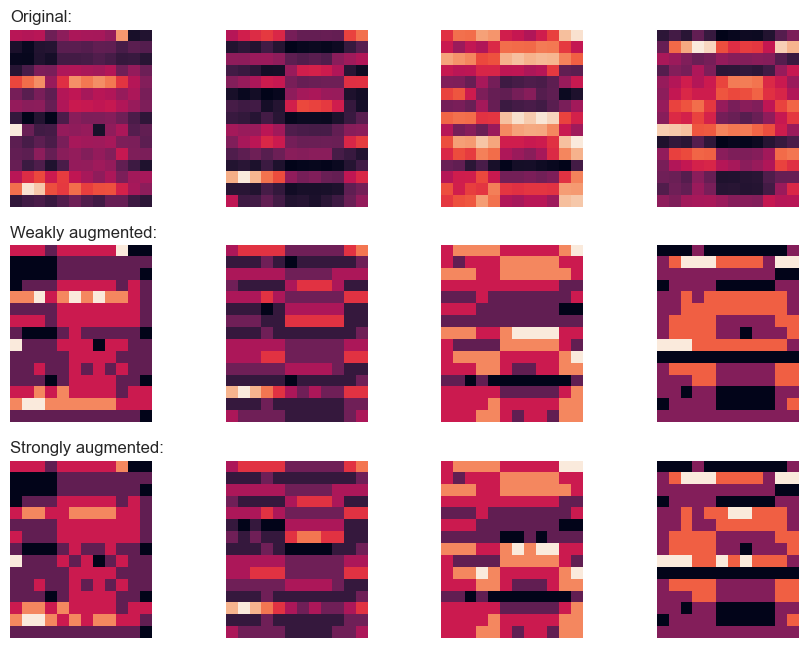

In [18]:
def visualize_augmentations(num_images):
    # Sample a batch from a dataset
    images = next(iter(train_dataset))[0][:num_images]
    
    # Apply augmentations
    augmented_images = zip(
        images,
        get_augmenter(**classification_augmentation)(images),
        get_augmenter(**contrastive_augmentation)(images),
    )
    row_titles = [
        "Original:",
        "Weakly augmented:",
        "Strongly augmented:",
    ]
    plt.figure(figsize=(num_images * 2.2, 4 * 2.2), dpi=100)
    for column, image_row in enumerate(augmented_images):
        for row, image in enumerate(image_row):
            plt.subplot(4, num_images, row * num_images + column + 1)
            plt.imshow(image)
            if column == 0:
                plt.title(row_titles[row], loc="left")
            plt.axis("off")
    plt.tight_layout()


visualize_augmentations(num_images=4)

In [19]:
# Baseline supervised training with random initialization
baseline_model = keras.Sequential(
    [
        layers.Input(shape=(temporal_samples, number_of_bands)),
        get_augmenter(**classification_augmentation),
        get_encoder(),
        layers.Dense(1, activation='sigmoid'),
    ],
    name="baseline_model",
)
baseline_model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.BinaryCrossentropy(from_logits=False),
    metrics=[keras.metrics.BinaryAccuracy(name="acc")],
)

baseline_history = baseline_model.fit(
    train_dataset, epochs=num_epochs, validation_data=test_dataset
)

print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(baseline_history.history["val_acc"]) * 100
    )
)

Epoch 1/40
20/20 [==============================] - 1s 12ms/step - loss: 0.5529 - acc: 0.7205 - val_loss: 0.4365 - val_acc: 0.8106
Epoch 2/40
20/20 [==============================] - 0s 6ms/step - loss: 0.4202 - acc: 0.8198 - val_loss: 0.3912 - val_acc: 0.8416
Epoch 3/40
20/20 [==============================] - 0s 7ms/step - loss: 0.3801 - acc: 0.8404 - val_loss: 0.3587 - val_acc: 0.8588
Epoch 4/40
20/20 [==============================] - 0s 7ms/step - loss: 0.3614 - acc: 0.8522 - val_loss: 0.3522 - val_acc: 0.8611
Epoch 5/40
20/20 [==============================] - 0s 6ms/step - loss: 0.3452 - acc: 0.8570 - val_loss: 0.3465 - val_acc: 0.8622
Epoch 6/40
20/20 [==============================] - 0s 6ms/step - loss: 0.3368 - acc: 0.8621 - val_loss: 0.3429 - val_acc: 0.8634
Epoch 7/40
20/20 [==============================] - 0s 8ms/step - loss: 0.3227 - acc: 0.8682 - val_loss: 0.3367 - val_acc: 0.8657
Epoch 8/40
20/20 [==============================] - 0s 7ms/step - loss: 0.3142 - acc: 0.8

In [20]:
class NNCLR(keras.Model):
    def __init__(
        self, temperature, queue_size,
    ):
        super().__init__()
        self.probe_accuracy = keras.metrics.SparseCategoricalAccuracy()
        self.correlation_accuracy = keras.metrics.SparseCategoricalAccuracy()
        self.contrastive_accuracy = keras.metrics.SparseCategoricalAccuracy()
        self.probe_loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)

        self.contrastive_augmenter = get_augmenter(**contrastive_augmentation)
        self.classification_augmenter = get_augmenter(**classification_augmentation)
        self.encoder = get_encoder()
        self.projection_head = keras.Sequential(
            [
                layers.Input(shape=(width,)),
                layers.Dense(width, activation="relu"),
                layers.Dense(width),
            ],
            name="projection_head",
        )
        self.linear_probe = keras.Sequential(
            [layers.Input(shape=(width,)), layers.Dense(2)], name="linear_probe"
        )
        self.temperature = temperature

        feature_dimensions = self.encoder.output_shape[1]
        self.feature_queue = tf.Variable(
            tf.math.l2_normalize(
                tf.random.normal(shape=(queue_size, feature_dimensions)), axis=1
            ),
            trainable=False,
        )

    def compile(self, contrastive_optimizer, probe_optimizer, **kwargs):
        super().compile(**kwargs)
        self.contrastive_optimizer = contrastive_optimizer
        self.probe_optimizer = probe_optimizer

    def nearest_neighbour(self, projections):
        support_similarities = tf.matmul(
            projections, self.feature_queue, transpose_b=True
        )
        nn_projections = tf.gather(
            self.feature_queue, tf.argmax(support_similarities, axis=1), axis=0
        )
        return projections + tf.stop_gradient(nn_projections - projections)

    def update_contrastive_accuracy(self, features_1, features_2):
        features_1 = tf.math.l2_normalize(features_1, axis=1)
        features_2 = tf.math.l2_normalize(features_2, axis=1)
        similarities = tf.matmul(features_1, features_2, transpose_b=True)

        batch_size = tf.shape(features_1)[0]
        contrastive_labels = tf.range(batch_size)
        self.contrastive_accuracy.update_state(
            tf.concat([contrastive_labels, contrastive_labels], axis=0),
            tf.concat([similarities, tf.transpose(similarities)], axis=0),
        )

    def update_correlation_accuracy(self, features_1, features_2):
        features_1 = (
            features_1 - tf.reduce_mean(features_1, axis=0)
        ) / tf.math.reduce_std(features_1, axis=0)
        features_2 = (
            features_2 - tf.reduce_mean(features_2, axis=0)
        ) / tf.math.reduce_std(features_2, axis=0)

        batch_size = tf.cast(tf.shape(features_1, out_type=tf.int32)[0],dtype=tf.float32)
        
        cross_correlation = (
            tf.matmul(features_1, features_2, transpose_a=True) / batch_size
        )

        feature_dim = tf.shape(features_1)[1]
        correlation_labels = tf.range(feature_dim)
        self.correlation_accuracy.update_state(
            tf.concat([correlation_labels, correlation_labels], axis=0),
            tf.concat([cross_correlation, tf.transpose(cross_correlation)], axis=0),
        )

    def contrastive_loss(self, projections_1, projections_2):
        projections_1 = tf.math.l2_normalize(projections_1, axis=1)
        projections_2 = tf.math.l2_normalize(projections_2, axis=1)

        similarities_1_2_1 = (
            tf.matmul(
                self.nearest_neighbour(projections_1), projections_2, transpose_b=True
            )
            / self.temperature
        )
        similarities_1_2_2 = (
            tf.matmul(
                projections_2, self.nearest_neighbour(projections_1), transpose_b=True
            )
            / self.temperature
        )

        similarities_2_1_1 = (
            tf.matmul(
                self.nearest_neighbour(projections_2), projections_1, transpose_b=True
            )
            / self.temperature
        )
        similarities_2_1_2 = (
            tf.matmul(
                projections_1, self.nearest_neighbour(projections_2), transpose_b=True
            )
            / self.temperature
        )
        
        batch_size = tf.shape(projections_1)[0]
        contrastive_labels = tf.range(batch_size)
        
       
        loss = keras.losses.sparse_categorical_crossentropy(
            tf.concat(
                [
                    contrastive_labels,
                    contrastive_labels,
                    contrastive_labels,
                    contrastive_labels,
                ],
                axis=0,
            ),
            tf.concat(
                [
                    similarities_1_2_1,
                    similarities_1_2_2,
                    similarities_2_1_1,
                    similarities_2_1_2,
                ],
                axis=0,
            ),
            from_logits=True,
        )

        self.feature_queue.assign(
            tf.concat([projections_1, self.feature_queue[:-batch_size]], axis=0)
        )
        return loss

    def train_step(self, data):
        (labeled_images, labels) = data
        images = labeled_images
        augmented_images_1 = self.contrastive_augmenter(images)
        augmented_images_2 = self.contrastive_augmenter(images)

        with tf.GradientTape() as tape:
            features_1 = self.encoder(augmented_images_1)
            features_2 = self.encoder(augmented_images_2)
            projections_1 = self.projection_head(features_1)
            projections_2 = self.projection_head(features_2)
            contrastive_loss = self.contrastive_loss(projections_1, projections_2)
        gradients = tape.gradient(
            contrastive_loss,
            self.encoder.trainable_weights + self.projection_head.trainable_weights,
        )
        self.contrastive_optimizer.apply_gradients(
            zip(
                gradients,
                self.encoder.trainable_weights + self.projection_head.trainable_weights,
            )
        )
        self.update_contrastive_accuracy(features_1, features_2)
        self.update_correlation_accuracy(features_1, features_2)
        preprocessed_images = self.classification_augmenter(labeled_images)

        with tf.GradientTape() as tape:
            features = self.encoder(preprocessed_images)
            class_logits = self.linear_probe(features)
            probe_loss = self.probe_loss(labels, class_logits)
        gradients = tape.gradient(probe_loss, self.linear_probe.trainable_weights)
        self.probe_optimizer.apply_gradients(
            zip(gradients, self.linear_probe.trainable_weights)
        )
        self.probe_accuracy.update_state(labels, class_logits)

        return {
            "c_loss": contrastive_loss,
            "c_acc": self.contrastive_accuracy.result(),
            "r_acc": self.correlation_accuracy.result(),
            "p_loss": probe_loss,
            "p_acc": self.probe_accuracy.result(),
        }

    def test_step(self, data):
        labeled_images, labels = data

        preprocessed_images = self.classification_augmenter(
            labeled_images, training=False
        )
        features = self.encoder(preprocessed_images, training=False)
        class_logits = self.linear_probe(features, training=False)
        probe_loss = self.probe_loss(labels, class_logits)

        self.probe_accuracy.update_state(labels, class_logits)
        return {"p_loss": probe_loss, "p_acc": self.probe_accuracy.result()}


# Contrastive pretraining
pretraining_model = NNCLR(temperature=temperature, queue_size=queue_size)
pretraining_model.compile(
    run_eagerly=True,
    contrastive_optimizer=keras.optimizers.Adam(),
    probe_optimizer=keras.optimizers.Adam(),
)
pretrain_history = pretraining_model.fit(
    train_dataset, epochs=num_epochs, validation_data=test_dataset
)


print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(pretrain_history.history["val_p_acc"]) * 100
    )
)

Epoch 1/40
20/20 [==============================] - 2s 87ms/step - c_loss: 2.5977 - c_acc: 1.0000 - r_acc: 0.9629 - p_loss: 0.7065 - p_acc: 0.5349 - val_p_loss: 0.7296 - val_p_acc: 0.5235
Epoch 2/40
20/20 [==============================] - 2s 86ms/step - c_loss: 1.1265 - c_acc: 0.9999 - r_acc: 0.8671 - p_loss: 0.7356 - p_acc: 0.5075 - val_p_loss: 0.7637 - val_p_acc: 0.5121
Epoch 3/40
20/20 [==============================] - 2s 85ms/step - c_loss: 0.5333 - c_acc: 1.0000 - r_acc: 0.8472 - p_loss: 0.7300 - p_acc: 0.5041 - val_p_loss: 0.7498 - val_p_acc: 0.5212acc: 0
Epoch 4/40
20/20 [==============================] - 2s 87ms/step - c_loss: 0.4311 - c_acc: 1.0000 - r_acc: 0.8498 - p_loss: 0.7137 - p_acc: 0.5177 - val_p_loss: 0.7397 - val_p_acc: 0.5408
Epoch 5/40
20/20 [==============================] - 2s 88ms/step - c_loss: 0.3867 - c_acc: 1.0000 - r_acc: 0.8470 - p_loss: 0.6968 - p_acc: 0.5373 - val_p_loss: 0.7301 - val_p_acc: 0.5580
Epoch 6/40
20/20 [==============================] - 2s

# Encoding a few samples

In [21]:
# Encoder for validation
encoder_model = keras.Sequential(
    [
        layers.Input(shape=(temporal_samples, number_of_bands)),
        get_augmenter(**classification_augmentation),
        pretraining_model.encoder,
    ],
    name="encoder_model",
)


encoded_vectors = encoder_model.predict(X_val)

print(encoded_vectors.shape)


(871, 60)


# Visualization of the encoded samples in the XY space

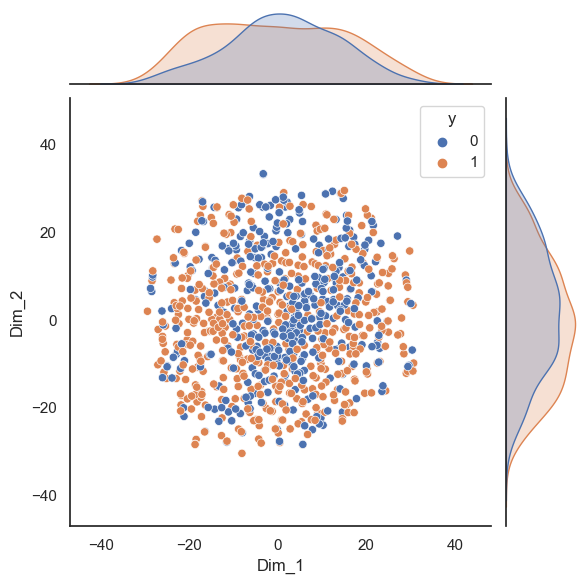

In [22]:
from sklearn.manifold import TSNE
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')



model = TSNE(n_components=2, random_state=0)
tsne_data = model.fit_transform(encoded_vectors)
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2"))

tsne_df = pd.concat([tsne_df, pd.DataFrame(y_val, columns=['y'])], axis=1)

sns.jointplot(data=tsne_df, x="Dim_1", y="Dim_2", hue='y')
plt.show()
warnings.filterwarnings('default')

# Checking similarities of encoded vectors

Avg Positive Similarity:  0.6588347778375696
Avg Negative Similarity:  0.6360326976867622
Avg Disimilarity P-N:  0.5651227074560964
Avg Disimilarity N-P:  0.5651227074560964


<AxesSubplot:>

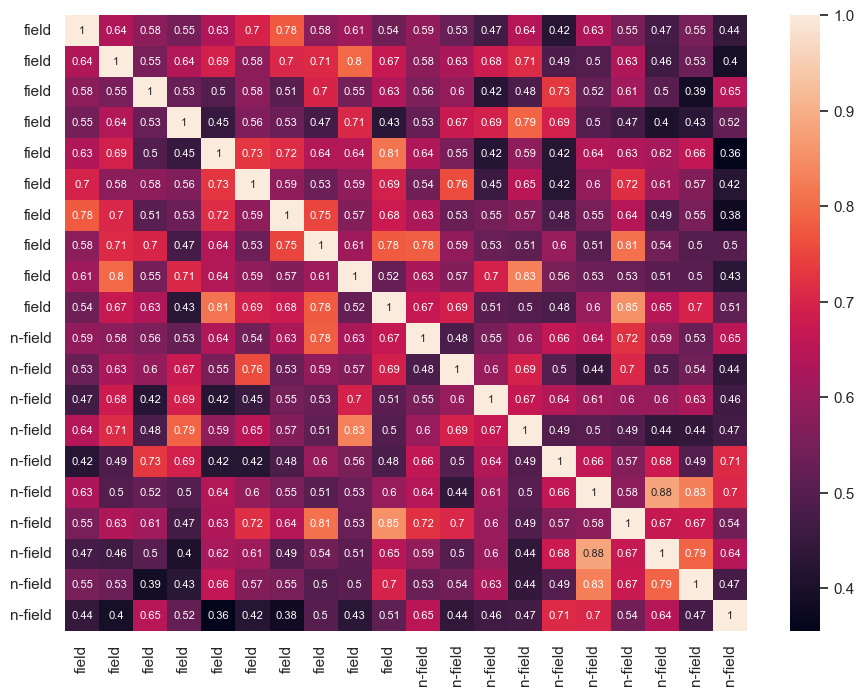

In [23]:
number_of_hexes= 10

df_test = pd.DataFrame(encoded_vectors)
df_test = pd.concat([
                     df_test,
                     pd.DataFrame(y_val, columns=['y'])
                     ], axis=1)

df_sample_five_positive = df_test.loc[df_test['y'] == 1].head(number_of_hexes)
df_sample_five_negative = df_test.loc[df_test['y'] == 0].head(number_of_hexes)
df_subsample = pd.concat([df_sample_five_positive, df_sample_five_negative])
df_labels = np.concatenate((np.repeat('field',number_of_hexes), np.repeat('n-field', number_of_hexes)))

df_subsample_norm = tf.math.l2_normalize(df_subsample, axis=1)
similarities = tf.matmul(df_subsample_norm, df_subsample_norm, transpose_b=True)

print('Avg Positive Similarity: ', np.average(similarities[0:number_of_hexes, 0:number_of_hexes]))
print('Avg Negative Similarity: ', np.average(similarities[number_of_hexes:number_of_hexes*2, number_of_hexes:number_of_hexes*2]))
print('Avg Disimilarity P-N: ', np.average(similarities[0:number_of_hexes, number_of_hexes:number_of_hexes*2]))
print('Avg Disimilarity N-P: ', np.average(similarities[number_of_hexes:number_of_hexes*2, 0:number_of_hexes]))

sns.heatmap(similarities.numpy(), xticklabels=df_labels, yticklabels=df_labels, annot=True, annot_kws={"fontsize":8} )

## Finetuning model

In [24]:
# Supervised finetuning of the pretrained encoder
finetuning_model = keras.Sequential(
    [
        layers.Input(shape=(temporal_samples, number_of_bands)),
        get_augmenter(**classification_augmentation),
        pretraining_model.encoder,
        layers.Dense(2),
    ],
    name="finetuning_model",
)

finetuning_model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc")],
)

finetuning_history = finetuning_model.fit(
    train_dataset, epochs=num_epochs, validation_data=test_dataset
)
print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(finetuning_history.history["val_acc"]) * 100
    )
)

Epoch 1/40
20/20 [==============================] - 0s 11ms/step - loss: 0.6956 - acc: 0.6118 - val_loss: 0.5553 - val_acc: 0.7199
Epoch 2/40
20/20 [==============================] - 0s 7ms/step - loss: 0.5224 - acc: 0.7557 - val_loss: 0.4556 - val_acc: 0.7968
Epoch 3/40
20/20 [==============================] - 0s 7ms/step - loss: 0.4295 - acc: 0.8121 - val_loss: 0.3998 - val_acc: 0.8232
Epoch 4/40
20/20 [==============================] - 0s 7ms/step - loss: 0.3877 - acc: 0.8330 - val_loss: 0.3724 - val_acc: 0.8416
Epoch 5/40
20/20 [==============================] - 0s 6ms/step - loss: 0.3643 - acc: 0.8464 - val_loss: 0.3562 - val_acc: 0.8450
Epoch 6/40
20/20 [==============================] - 0s 6ms/step - loss: 0.3513 - acc: 0.8523 - val_loss: 0.3492 - val_acc: 0.8485
Epoch 7/40
20/20 [==============================] - 0s 6ms/step - loss: 0.3363 - acc: 0.8625 - val_loss: 0.3409 - val_acc: 0.8599
Epoch 8/40
20/20 [==============================] - 0s 6ms/step - loss: 0.3265 - acc: 0.8

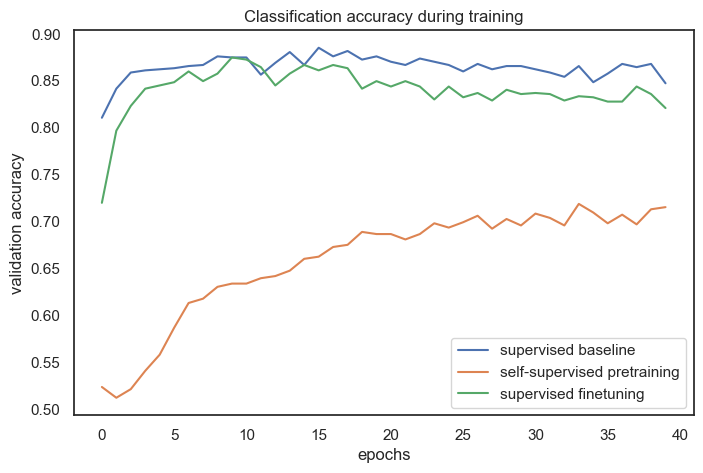

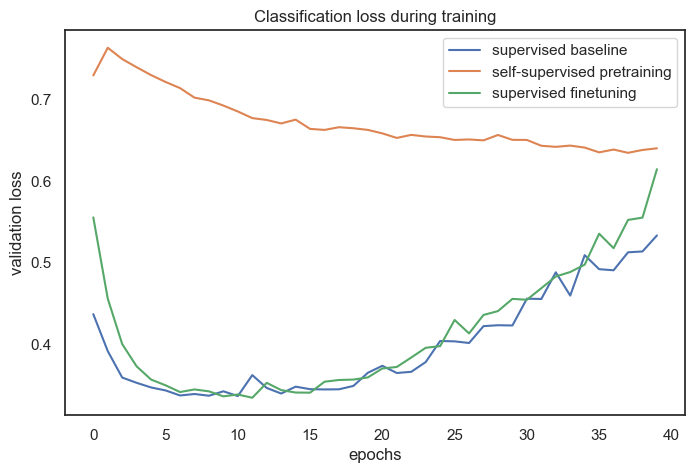

In [25]:
# The classification accuracies of the baseline and the pretraining + finetuning process:
def plot_training_curves(pretraining_history, finetuning_history, baseline_history):
    for metric_key, metric_name in zip(["acc", "loss"], ["accuracy", "loss"]):
        plt.figure(figsize=(8, 5), dpi=100)
        plt.plot(
            baseline_history.history[f"val_{metric_key}"], label="supervised baseline"
        )
        plt.plot(
            pretraining_history.history[f"val_p_{metric_key}"],
            label="self-supervised pretraining",
        )
        plt.plot(
            finetuning_history.history[f"val_{metric_key}"],
            label="supervised finetuning",
        )
        plt.legend()
        plt.title(f"Classification {metric_name} during training")
        plt.xlabel("epochs")
        plt.ylabel(f"validation {metric_name}")


plot_training_curves(pretrain_history, finetuning_history, baseline_history)

In [26]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

output = finetuning_model.predict(validation_dataset)
result = (output[:,0] < output[:,1]).astype(int)

print(accuracy_score(y_val, result))
print(confusion_matrix(y_val, result))
accuracy_list = (y_val==result)

0.7956371986222732
[[269 115]
 [ 63 424]]


In [30]:
df_classes = pd.DataFrame(result, columns=['label'])
df_hexes = pd.DataFrame(hexes_val, columns=['hex'])

df_predict = pd.concat([df_hexes,df_classes], axis=1)

center = h3.h3_to_geo_boundary(h=df_predict.iloc[0]['hex'],geo_json=True)

m = folium.Map(location=(center[0][1], center[0][0]),
                tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                attr = 'Esri',
                name = 'Esri Satellite',
                overlay = False,
                control = True)

for index, row in df_predict.iterrows():
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
    
    if accuracy_list[index] == True:
        if row['label'] == 0:
            geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'red', 'color': 'red', 'weight': 0.5})
        elif row['label'] == 1:
            geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'green', 'color': 'green', 'weight': 0.5})  
        else:
            geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'black', 'color': 'black', 'weight': 0.5})
        folium.Popup(str(row['hex'])).add_to(geo_j)
    else:
        if result[index] == 1:
            geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'blue', 'color': 'green', 'weight': 0.5})
        else:
            geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'blue', 'color': 'red', 'weight': 0.5})
        folium.Popup(str(row['hex'])).add_to(geo_j)
    geo_j.add_to(m)

m

In [28]:
import IPython
IPython.display.Audio("C:\\Users\\en89912\\Downloads\\bensound-ukulele.mp3", autoplay=True)

# End of Notebook